# Import Necessary Packages

In [1]:
import torch
import matplotlib.pyplot as plt
import networkx as nx
from torch_geometric.utils import to_networkx, degree
import matplotlib.patches as mpatches
from torch_geometric.data import DataLoader
from ogb.nodeproppred import PygNodePropPredDataset, Evaluator
from torch_geometric.nn import GCNConv
from torch_geometric.utils import subgraph
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import roc_curve, auc, precision_recall_curve, confusion_matrix
import seaborn as sns
import numpy as np
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from torch_geometric.data import Data
from sklearn.model_selection import train_test_split

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

C:\Users\Shehab\AppData\Local\Temp\ipykernel_18848\201846295.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('viridis', len(unique_labels))


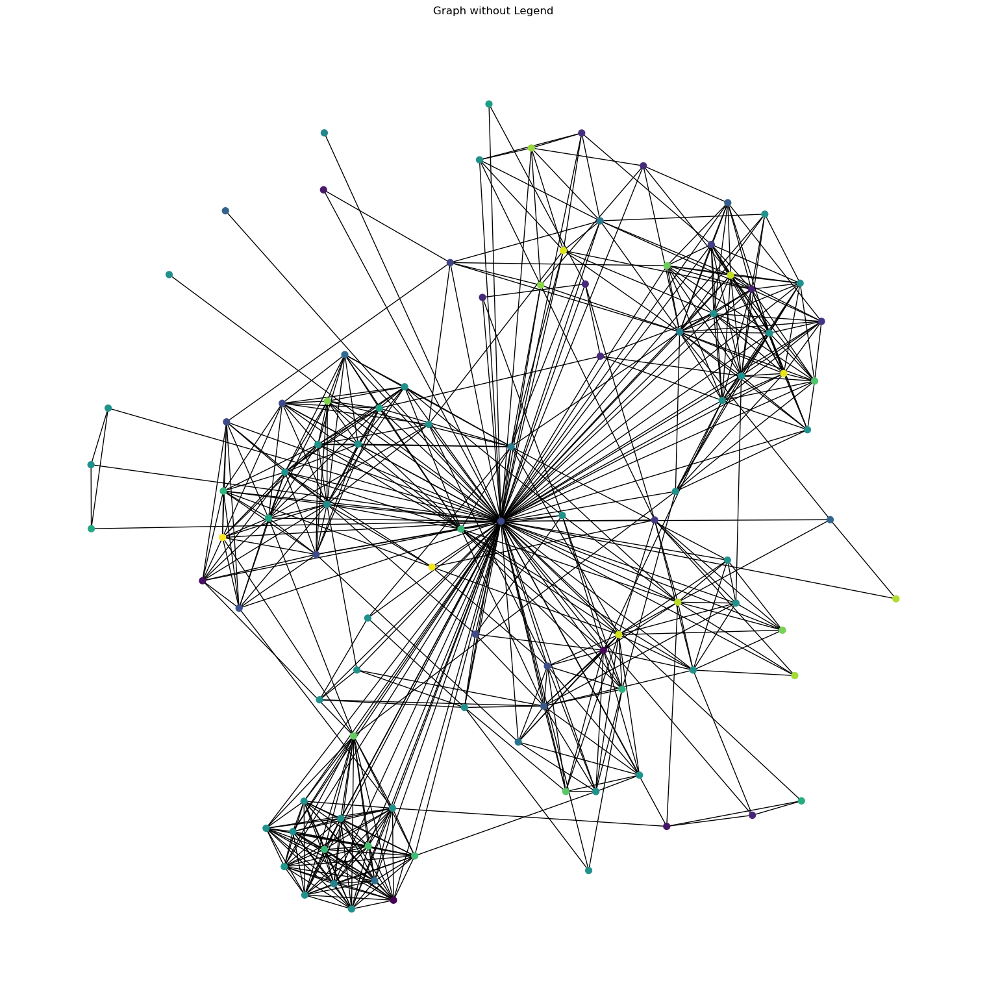

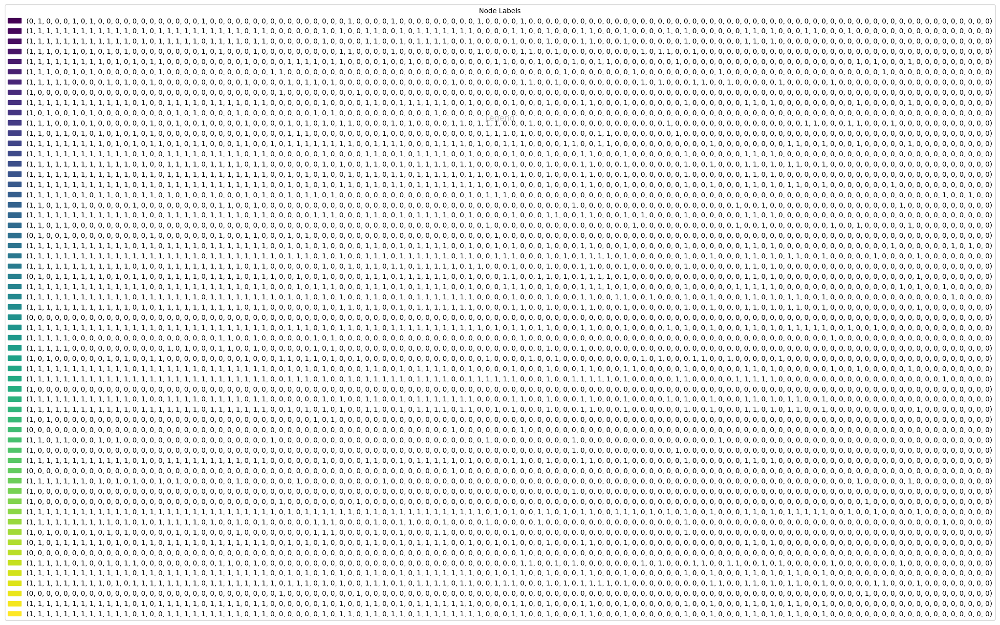

In [28]:
dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

num_nodes = 100
subgraph_mask = torch.arange(num_nodes)
subgraph = data.subgraph(subgraph_mask)

G = to_networkx(subgraph, to_undirected=True)

labels = data.y[subgraph_mask].squeeze().tolist()

if isinstance(labels[0], list):
    labels = [tuple(label) for label in labels]

unique_labels = list(set(labels))
color_map = plt.cm.get_cmap('viridis', len(unique_labels))
node_colors = [color_map(unique_labels.index(label)) for label in labels]

plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42) 
nx.draw(G, pos, node_size=50, node_color=node_colors, with_labels=False)
plt.title('Graph without Legend')
plt.show()

plt.figure(figsize=(5, 10))
used_labels = list(set(labels))
legend_labels = [str(label) for label in used_labels]
patches = [mpatches.Patch(color=color_map(unique_labels.index(label)), label=legend_labels[i]) for i, label in enumerate(used_labels)]
plt.legend(handles=patches, loc='center', title="Node Labels")
plt.axis('off')
plt.title('Legend')
plt.show()


The algorithm identified 18 cliques of size 4 (4-cliques) within the subgraph. A clique is a subset of nodes in a graph where every two distinct nodes are adjacent, meaning there is a direct edge between every pair of nodes within the clique.

Each list following this statement represents one of the 4-cliques found in the subgraph. The numbers within the brackets are the node indices that form a 4-clique.

C:\Users\Shehab\AppData\Local\Temp\ipykernel_13480\1217658041.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('viridis', len(unique_labels))


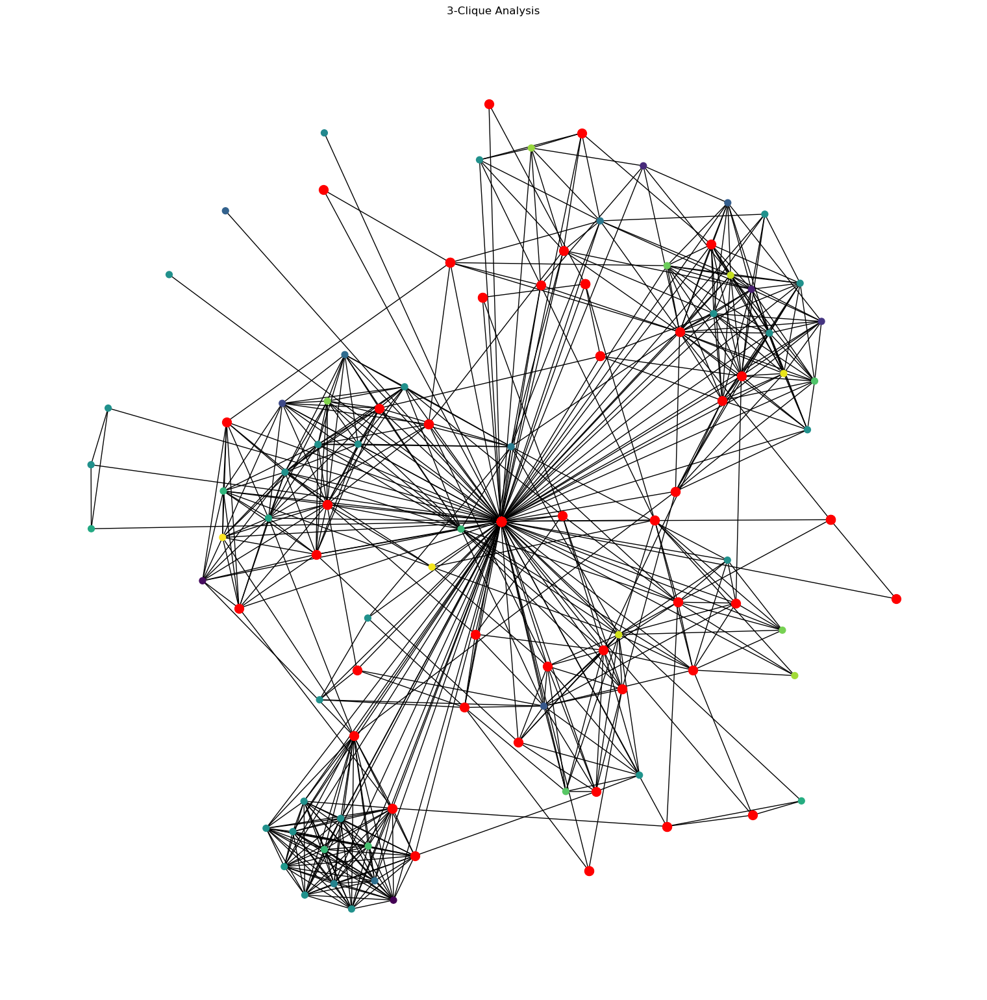

Found 30 3-cliques:
[0, 5, 64]
[0, 7, 36]
[0, 8, 47]
[0, 15, 64]
[0, 15, 65]
[0, 17, 90]
[0, 17, 77]
[0, 18, 62]
[0, 19, 33]
[0, 19, 36]
[0, 19, 53]
[0, 19, 46]
[0, 22, 47]
[0, 26, 67]
[0, 29, 57]
[0, 33, 43]
[0, 38, 16]
[0, 39, 57]
[0, 41, 61]
[0, 42, 1]
[0, 48, 57]
[0, 48, 76]
[0, 48, 79]
[0, 53, 9]
[0, 56, 72]
[0, 58, 72]
[0, 59, 63]
[0, 65, 72]
[0, 77, 16]
[0, 93, 98]


In [2]:
dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

num_nodes = 100
subgraph_mask = torch.arange(num_nodes)
subgraph = data.subgraph(subgraph_mask)

G = to_networkx(subgraph, to_undirected=True)

labels = data.y[subgraph_mask].squeeze().tolist()

labels = [tuple(label) for label in labels]

unique_labels = list(set(labels))
color_map = plt.cm.get_cmap('viridis', len(unique_labels))
node_colors = [color_map(unique_labels.index(label)) for label in labels]

cliques = list(nx.find_cliques(G))

k = 3  
k_cliques = [clique for clique in cliques if len(clique) == k]

plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42) 
nx.draw(G, pos, node_size=50, node_color=node_colors, with_labels=False)

for clique in k_cliques:
    nx.draw_networkx_nodes(G, pos, nodelist=clique, node_color='r', node_size=100)

plt.title(f'{k}-Clique Analysis')
plt.show()

print(f"Found {len(k_cliques)} {k}-cliques:")
for clique in k_cliques:
    print(clique)


C:\Users\Shehab\AppData\Local\Temp\ipykernel_18848\2037376319.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('viridis', len(unique_labels))


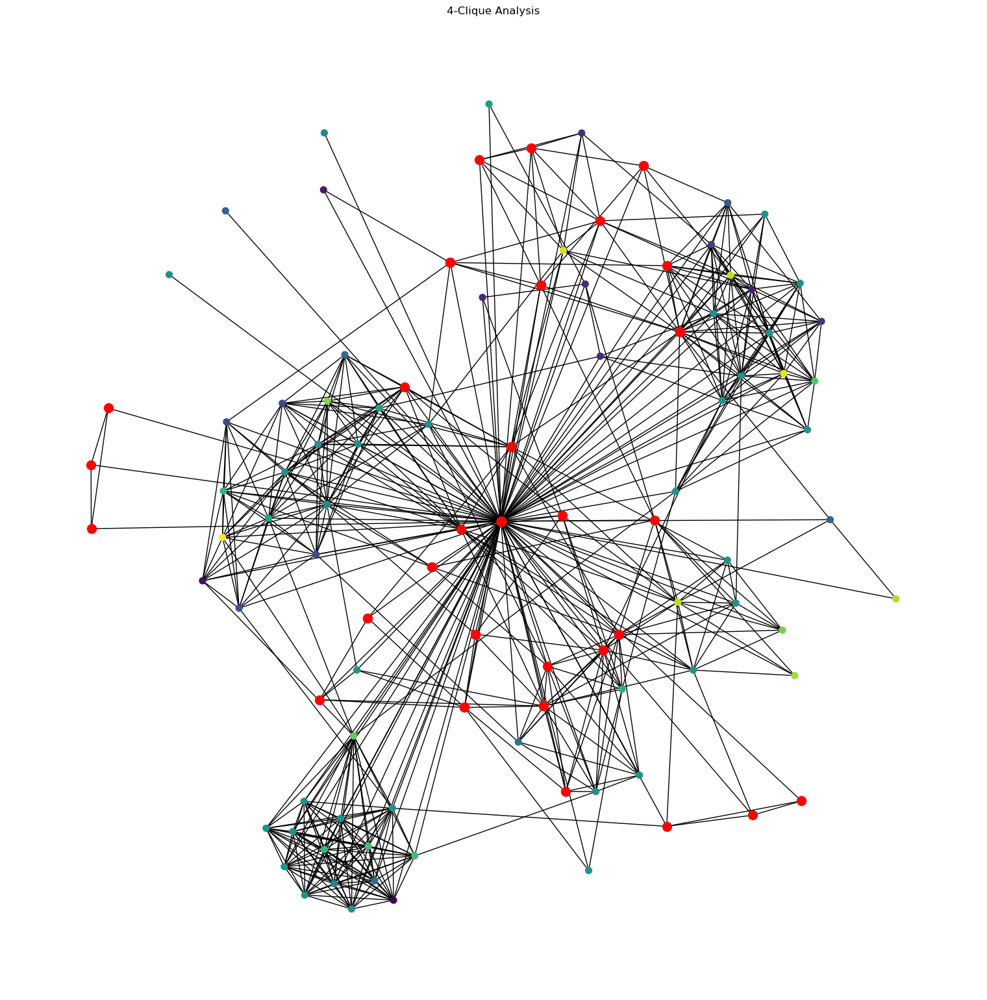

Found 18 4-cliques:
[0, 2, 10, 95]
[0, 6, 43, 94]
[0, 8, 41, 49]
[0, 8, 41, 43]
[0, 8, 90, 49]
[0, 15, 98, 30]
[0, 28, 55, 53]
[0, 28, 55, 79]
[0, 37, 82, 9]
[0, 49, 90, 86]
[0, 56, 9, 80]
[0, 56, 9, 57]
[0, 56, 9, 23]
[0, 56, 57, 25]
[0, 56, 57, 99]
[0, 68, 81, 90]
[0, 81, 80, 90]
[0, 82, 23, 9]


In [30]:
dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

num_nodes = 100
subgraph_mask = torch.arange(num_nodes)
subgraph = data.subgraph(subgraph_mask)

G = to_networkx(subgraph, to_undirected=True)

labels = data.y[subgraph_mask].squeeze().tolist()

labels = [tuple(label) for label in labels]

unique_labels = list(set(labels))
color_map = plt.cm.get_cmap('viridis', len(unique_labels))
node_colors = [color_map(unique_labels.index(label)) for label in labels]

cliques = list(nx.find_cliques(G))


k = 4  
k_cliques = [clique for clique in cliques if len(clique) == k]

plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42)  
nx.draw(G, pos, node_size=50, node_color=node_colors, with_labels=False)

for clique in k_cliques:
    nx.draw_networkx_nodes(G, pos, nodelist=clique, node_color='r', node_size=100)

plt.title(f'{k}-Clique Analysis')
plt.show()

print(f"Found {len(k_cliques)} {k}-cliques:")
for clique in k_cliques:
    print(clique)


C:\Users\Shehab\AppData\Local\Temp\ipykernel_13480\21624771.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('viridis', len(unique_labels))


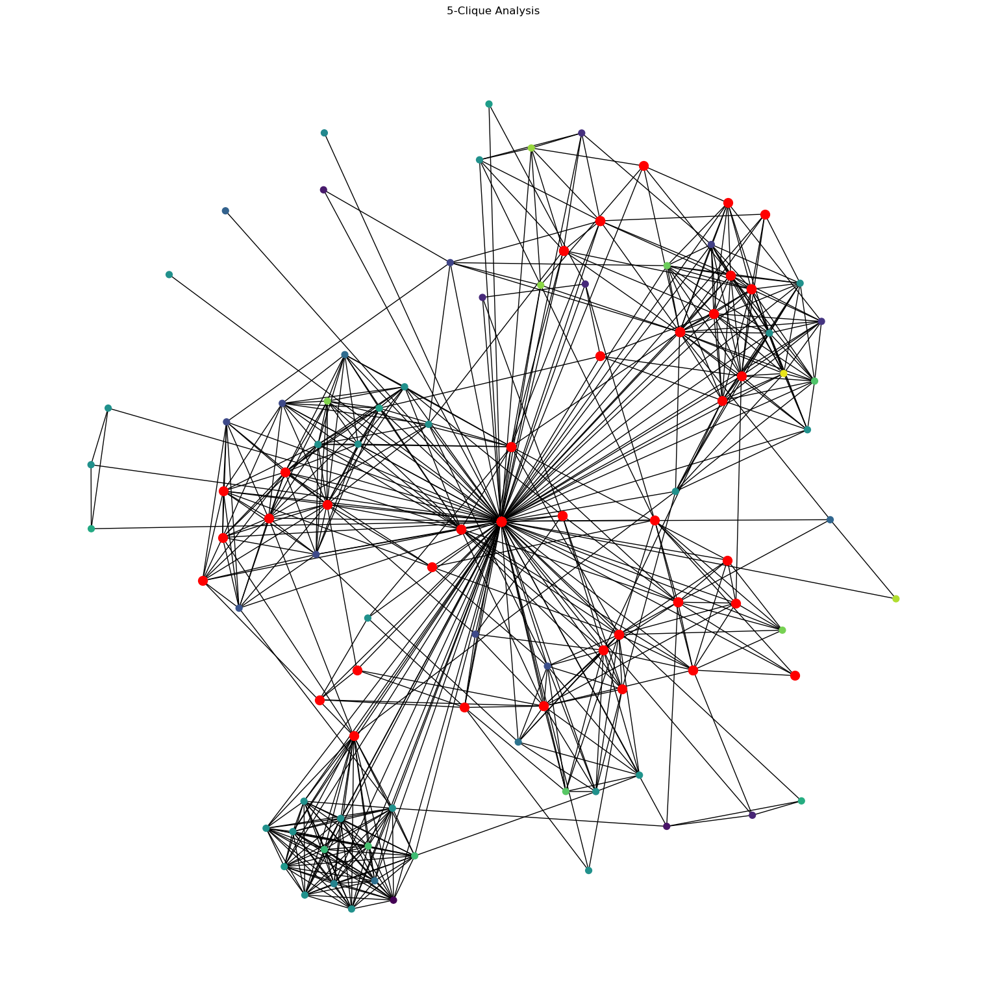

Found 16 5-cliques:
[0, 6, 65, 80, 55]
[0, 6, 65, 41, 43]
[0, 6, 41, 77, 43]
[0, 13, 38, 24, 75]
[0, 22, 49, 90, 68]
[0, 28, 97, 51, 47]
[0, 36, 11, 61, 63]
[0, 49, 59, 93, 55]
[0, 53, 65, 93, 96]
[0, 55, 65, 70, 80]
[0, 56, 44, 89, 99]
[0, 56, 44, 76, 99]
[0, 56, 44, 76, 11]
[0, 56, 44, 71, 99]
[0, 56, 80, 99, 76]
[0, 56, 23, 45, 71]


In [3]:
dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

num_nodes = 100
subgraph_mask = torch.arange(num_nodes)
subgraph = data.subgraph(subgraph_mask)

G = to_networkx(subgraph, to_undirected=True)

labels = data.y[subgraph_mask].squeeze().tolist()

labels = [tuple(label) for label in labels]

unique_labels = list(set(labels))
color_map = plt.cm.get_cmap('viridis', len(unique_labels))
node_colors = [color_map(unique_labels.index(label)) for label in labels]

cliques = list(nx.find_cliques(G))

k = 5  
k_cliques = [clique for clique in cliques if len(clique) == k]

plt.figure(figsize=(15, 15))
pos = nx.spring_layout(G, seed=42)  
nx.draw(G, pos, node_size=50, node_color=node_colors, with_labels=False)

for clique in k_cliques:
    nx.draw_networkx_nodes(G, pos, nodelist=clique, node_color='r', node_size=100)

plt.title(f'{k}-Clique Analysis')
plt.show()

print(f"Found {len(k_cliques)} {k}-cliques:")
for clique in k_cliques:
    print(clique)


# GCN

Graph Convolutional Networks (GCNs) are a type of neural network specifically designed to work with graph-structured data. They extend the idea of convolution from grid-like data (such as images) to graphs, where data is represented by nodes (vertices) and edges (connections between nodes). GCNs can capture the structure of the graph and the features of the nodes in a way that traditional neural networks cannot.

GCN consists of:
- Graph Convolutional Layer (GCNConv): This layer performs a convolution operation on the graph. It aggregates feature information from a node's neighbors to update the node's own features. This allows the network to learn representations that consider both the features of a node and the structure of the graph.

- Activation Function: After each convolutional layer, a non-linear activation function (e.g., ReLU) is applied to introduce non-linearity into the model.

- Loss Function: The loss function measures the difference between the predicted labels and the actual labels. For multi-label classification tasks, Binary Cross-Entropy with Logits Loss (BCEWithLogitsLoss) is commonly used.

- Optimizer: The optimizer updates the model parameters to minimize the loss function. Adam optimizer is a popular choice for training GCNs. <br>

In this code, the GCN class defines a two-layer GCN. The first layer transforms the input features to a hidden representation, and the second layer transforms the hidden representation to the output representation. The GCN class defines a two-layer GCN. The first layer transforms the input features to a hidden representation, and the second layer transforms the hidden representation to the output representation.


In [33]:
# Load the dataset
dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

# Extract the subgraph with the first 10000 nodes
node_indices = torch.arange(10000)  # Subgraph 
sub_edge_index, _ = subgraph(node_indices, data.edge_index)

sub_data = data.clone()
sub_data.edge_index = sub_edge_index
sub_data.y = data.y[node_indices]

# Generate random node features since the dataset has no node features
sub_data.x = torch.randn((len(node_indices), 8))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
sub_data = sub_data.to(device)

print(sub_data)

class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = self.conv2(x, edge_index)
        return x

model = GCN(in_channels=sub_data.num_features, hidden_channels=64, out_channels=112)  # 112 is the correct number of classes for ogbn-proteins
model = model.to(device)
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

writer = SummaryWriter(log_dir='./runs/ogbn_proteins_gcn')

# Training loop
model.train()
for epoch in range(100):
    optimizer.zero_grad()
    out = model(sub_data)
    loss = criterion(out, sub_data.y.float())
    loss.backward()
    optimizer.step()

    writer.add_scalar('Loss/train', loss.item(), epoch)
    print(f'Epoch {epoch+1}, Loss: {loss.item()}')

    # Log histograms of model weights and biases
    for name, param in model.named_parameters():
        writer.add_histogram(name, param, epoch)
        if param.grad is not None:
            writer.add_histogram(f'{name}.grad', param.grad, epoch)

    # Log the learning rate
    for param_group in optimizer.param_groups:
        writer.add_scalar('Learning Rate', param_group['lr'], epoch)

# Evaluate the model
model.eval()
with torch.no_grad():
    out = model(sub_data)
    pred = (out > 0).float()
    correct = pred.eq(sub_data.y).sum().item()
    acc = correct / sub_data.y.numel()
    print(f'Accuracy: {acc}')
    writer.add_scalar('Accuracy/test', acc, epoch)

    # Calculate ROC curve and AUC
    y_true = sub_data.y.cpu().numpy().ravel()
    y_score = out.cpu().numpy().ravel()
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    # Log ROC curve to TensorBoard
    writer.add_pr_curve('ROC', y_true, y_score, global_step=epoch)
    writer.add_scalar('AUC/test', roc_auc, epoch)

    # Calculate Precision-Recall curve
    precision, recall, _ = precision_recall_curve(y_true, y_score)

    # Log Precision-Recall curve to TensorBoard
    writer.add_pr_curve('Precision-Recall', y_true, y_score, global_step=epoch)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_true, y_score.round())
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    # Log confusion matrix as an image to TensorBoard
    writer.add_figure('Confusion Matrix', plt.gcf(), global_step=epoch)

# Save the model
torch.save(model.state_dict(), 'gcn_model.pth')

# Close the TensorBoard writer
writer.close()


Data(num_nodes=132534, edge_index=[2, 5387822], edge_attr=[79122504, 8], node_species=[132534, 1], y=[10000, 112], x=[10000, 8])
Epoch 1, Loss: 0.6935900449752808
Epoch 2, Loss: 0.68741774559021
Epoch 3, Loss: 0.6807335019111633
Epoch 4, Loss: 0.6726579070091248
Epoch 5, Loss: 0.6627892851829529
Epoch 6, Loss: 0.6509026885032654
Epoch 7, Loss: 0.6368910670280457
Epoch 8, Loss: 0.620747447013855
Epoch 9, Loss: 0.6025873422622681
Epoch 10, Loss: 0.5826535820960999
Epoch 11, Loss: 0.5613251328468323
Epoch 12, Loss: 0.5391005277633667
Epoch 13, Loss: 0.5165785551071167
Epoch 14, Loss: 0.49443793296813965
Epoch 15, Loss: 0.47339698672294617
Epoch 16, Loss: 0.4541442394256592
Epoch 17, Loss: 0.43726846575737
Epoch 18, Loss: 0.42318567633628845
Epoch 19, Loss: 0.4120902717113495
Epoch 20, Loss: 0.40393850207328796
Epoch 21, Loss: 0.39846351742744446
Epoch 22, Loss: 0.395207017660141
Epoch 23, Loss: 0.3935798704624176
Epoch 24, Loss: 0.3929624557495117
Epoch 25, Loss: 0.3928062915802002
Epoch 

# GAT

Graph Attention Networks (GATs) are a type of neural network designed to work with graph-structured data, similar to Graph Convolutional Networks (GCNs). However, GATs use attention mechanisms to weigh the importance of neighboring nodes, allowing the network to focus on the most relevant parts of the graph when aggregating node features.

GAT consists of:
- Graph Attention Layer (GATConv): This layer performs attention-based aggregation on the graph. It assigns different weights to different neighbors based on their importance, learned through the attention mechanism.

- Multi-Head Attention: GATs often use multiple attention heads in each layer. This allows the model to attend to different parts of the graph simultaneously, improving its ability to learn complex relationships.

- Activation Function: After each attention layer, a non-linear activation function (e.g., ReLU) is applied to introduce non-linearity into the model.

- Loss Function: The loss function measures the difference between the predicted labels and the actual labels. For multi-label classification tasks, Binary Cross-Entropy with Logits Loss (BCEWithLogitsLoss) is commonly used.

- Optimizer: The optimizer updates the model parameters to minimize the loss function. Adam optimizer is a popular choice for training GATs. <br>

The GAT uses attention mechanisms to weigh the importance of neighboring nodes when aggregating node features, allowing it to learn representations that consider both the features of a node and the structure of the graph. The training process involves minimizing a binary cross-entropy loss, while the evaluation measures the model's accuracy on the subgraph.

In [32]:


# Load the dataset
dataset = PygNodePropPredDataset(name='ogbn-proteins')

# Get the data object
data = dataset[0]

# Select a small part of the dataset (e.g., first 1000 nodes)
node_indices = torch.arange(1000)
sub_edge_index, _ = subgraph(node_indices, data.edge_index)

# Create a new data object for the subgraph
sub_data = data.clone()
sub_data.edge_index = sub_edge_index
sub_data.y = data.y[node_indices]

# Generate node features (e.g., using random features since the dataset has no node features)
sub_data.x = torch.randn((len(node_indices), 8))  # Let's assume 8 features per node
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
sub_data = sub_data.to(device)
# Verify the new data object
print(sub_data)

class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=1):
        super(GAT, self).__init__()
        self.conv1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.conv2 = GATConv(hidden_channels * heads, out_channels, heads=1)  # Single head in the final layer

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = torch.relu(x)
        x = self.conv2(x, edge_index)
        return x

# Define the model, loss, and optimizer
model = GAT(in_channels=sub_data.num_features, hidden_channels=64, out_channels=112, heads=8)  # 8 attention heads
model = model.to(device)
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# Set up TensorBoard writer
writer = SummaryWriter(log_dir='./runs/ogbn_proteins_gat')

# Training loop
model.train()
for epoch in range(100):
    optimizer.zero_grad()
    out = model(sub_data)
    loss = criterion(out, sub_data.y.float())  # Ensure the target is of type float
    loss.backward()
    optimizer.step()

    # Log the loss to TensorBoard
    writer.add_scalar('Loss/train', loss.item(), epoch)
    print(f'Epoch {epoch+1}, Loss: {loss.item()}')

    # Log histograms of model weights and biases
    for name, param in model.named_parameters():
        writer.add_histogram(name, param, epoch)
        if param.grad is not None:
            writer.add_histogram(f'{name}.grad', param.grad, epoch)

    # Log the learning rate
    for param_group in optimizer.param_groups:
        writer.add_scalar('Learning Rate', param_group['lr'], epoch)

# Evaluate the model
model.eval()
with torch.no_grad():
    out = model(sub_data)
    pred = (out > 0).float()
    correct = pred.eq(sub_data.y).sum().item()
    acc = correct / sub_data.y.numel()
    print(f'Accuracy: {acc}')
    # Log the accuracy to TensorBoard
    writer.add_scalar('Accuracy/test', acc, epoch)

    # Calculate ROC curve and AUC
    y_true = sub_data.y.cpu().numpy().ravel()
    y_score = out.cpu().numpy().ravel()
    fpr, tpr, _ = roc_curve(y_true, y_score)
    roc_auc = auc(fpr, tpr)

    # Log ROC curve to TensorBoard
    writer.add_pr_curve('ROC', y_true, y_score, global_step=epoch)
    writer.add_scalar('AUC/test', roc_auc, epoch)

    # Calculate Precision-Recall curve
    precision, recall, _ = precision_recall_curve(y_true, y_score)

    # Log Precision-Recall curve to TensorBoard
    writer.add_pr_curve('Precision-Recall', y_true, y_score, global_step=epoch)

    # Calculate and plot confusion matrix
    conf_matrix = confusion_matrix(y_true, y_score.round())
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    # Log confusion matrix as an image to TensorBoard
    writer.add_figure('Confusion Matrix', plt.gcf(), global_step=epoch)

# Save the model
torch.save(model.state_dict(), 'gat_model.pth')

# Close the TensorBoard writer
writer.close()


Data(num_nodes=132534, edge_index=[2, 94170], edge_attr=[79122504, 8], node_species=[132534, 1], y=[1000, 112], x=[1000, 8])
Epoch 1, Loss: 0.6933179497718811
Epoch 2, Loss: 0.6615973711013794
Epoch 3, Loss: 0.6049427390098572
Epoch 4, Loss: 0.5156975984573364
Epoch 5, Loss: 0.42439430952072144
Epoch 6, Loss: 0.4190700948238373
Epoch 7, Loss: 0.44456708431243896
Epoch 8, Loss: 0.42184925079345703
Epoch 9, Loss: 0.3911231458187103
Epoch 10, Loss: 0.3785681426525116
Epoch 11, Loss: 0.38120976090431213
Epoch 12, Loss: 0.3871804177761078
Epoch 13, Loss: 0.3898012638092041
Epoch 14, Loss: 0.38765957951545715
Epoch 15, Loss: 0.3825567066669464
Epoch 16, Loss: 0.3775648772716522
Epoch 17, Loss: 0.37537163496017456
Epoch 18, Loss: 0.37665262818336487
Epoch 19, Loss: 0.3790114223957062
Epoch 20, Loss: 0.3797352910041809
Epoch 21, Loss: 0.37835901975631714
Epoch 22, Loss: 0.375991553068161
Epoch 23, Loss: 0.37402448058128357
Epoch 24, Loss: 0.3732471764087677
Epoch 25, Loss: 0.3735567331314087
E

In [ ]:
%reload_ext tensorboard

In [ ]:
#%load_ext tensorboard

%tensorboard --logdir=./runs/ogbn_proteins_gat

<IPython.core.display.Javascript object>

In [12]:
import torch
from torch_geometric.data import Data
from torch_geometric.utils import to_networkx, degree
from ogb.nodeproppred import PygNodePropPredDataset
import networkx as nx
import matplotlib.pyplot as plt

# Load the dataset
dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

# Extract the first 100 nodes and their features
num_nodes = 100
subgraph_mask = torch.arange(num_nodes)

# Check if the dataset has node features
if data.x is None:
    print("Node features are missing, creating degree-based features.")
    # Calculate the degree of each node
    subgraph_edge_index = data.edge_index[:, (data.edge_index[0] < num_nodes) & (data.edge_index[1] < num_nodes)]
    degrees = degree(subgraph_edge_index[0], num_nodes=num_nodes)
    subgraph_x = degrees.view(-1, 1)  # Use degree as a feature
else:
    subgraph_x = data.x[subgraph_mask]

subgraph_y = data.y[subgraph_mask]
subgraph_edge_index = data.edge_index[:, (data.edge_index[0] < num_nodes) & (data.edge_index[1] < num_nodes)]

# Create a subgraph Data object
subgraph = Data(x=subgraph_x, edge_index=subgraph_edge_index, y=subgraph_y)

# Convert to NetworkX graph for easy plotting
G = to_networkx(subgraph, to_undirected=True)

# Find all cliques in the graph
cliques = list(nx.find_cliques(G))

# Filter cliques to find only k-cliques
k = 5  # Change this value to the desired size of the clique
k_cliques = [clique for clique in cliques if len(clique) == k]

# Initialize a feature matrix with the original node features
features = subgraph.x.clone()

# Add a new feature column for k-clique participation
k_clique_feature = torch.zeros(num_nodes, 1)
for clique in k_cliques:
    for node in clique:
        k_clique_feature[node] = 1

# Concatenate the k-clique feature to the original features
features = torch.cat([features, k_clique_feature], dim=1)

# Create a new Data object with the updated features
new_data = Data(x=features, edge_index=subgraph.edge_index, y=subgraph.y)

print(f"New feature matrix shape: {new_data.x.shape}")
print(f"First 10 nodes' features:\n{new_data.x[:10]}")


Node features are missing, creating degree-based features.
New feature matrix shape: torch.Size([100, 2])
First 10 nodes' features:
tensor([[99.,  1.],
        [13.,  0.],
        [ 3.,  0.],
        [ 1.,  0.],
        [15.,  0.],
        [10.,  0.],
        [19.,  1.],
        [14.,  0.],
        [ 6.,  0.],
        [ 8.,  0.]])


In [13]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GCNConv
from torch_geometric.loader import DataLoader
from sklearn.model_selection import train_test_split

class GCN(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(GCN, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.relu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Split data into train and test sets
train_idx, test_idx = train_test_split(torch.arange(num_nodes), test_size=0.2, random_state=42)
train_mask = torch.zeros(num_nodes, dtype=torch.bool)
test_mask = torch.zeros(num_nodes, dtype=torch.bool)
train_mask[train_idx] = True
test_mask[test_idx] = True

# Add masks to new_data
new_data.train_mask = train_mask
new_data.test_mask = test_mask

# Ensure target tensor is 1D
new_data.y = new_data.y.view(-1)

# Initialize and train the model
model = GCN(in_channels=new_data.num_node_features, hidden_channels=16, out_channels=dataset.num_classes)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
model.train()

for epoch in range(200):
    optimizer.zero_grad()
    out = model(new_data)
    loss = F.nll_loss(out[new_data.train_mask], new_data.y[new_data.train_mask])
    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')

# Evaluate the model
model.eval()
_, pred = model(new_data).max(dim=1)
correct = int(pred[new_data.test_mask].eq(new_data.y[new_data.test_mask]).sum().item())
acc = correct / int(new_data.test_mask.sum())
print(f'Accuracy: {acc:.4f}')


IndexError: The shape of the mask [100] at index 0 does not match the shape of the indexed tensor [11200] at index 0

In [14]:
import torch
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from sklearn.model_selection import train_test_split

class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=1):
        super(GAT, self).__init__()
        self.conv1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.conv2 = GATConv(hidden_channels * heads, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.elu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

# Create synthetic node features if not present
if data.x is None:
    num_features = 10  # Number of synthetic features
    data.x = torch.rand(data.num_nodes, num_features)

# Extract the first 100 nodes and their features
num_nodes = 100
subgraph_mask = torch.arange(num_nodes)
subgraph_x = data.x[subgraph_mask]
subgraph_y = data.y[subgraph_mask]
subgraph_edge_index = data.edge_index[:, (data.edge_index[0] < num_nodes) & (data.edge_index[1] < num_nodes)]

# Create a subgraph Data object
subgraph = Data(x=subgraph_x, edge_index=subgraph_edge_index, y=subgraph_y)

# Find all cliques in the graph
G = to_networkx(subgraph, to_undirected=True)
cliques = list(nx.find_cliques(G))

# Filter cliques to find only k-cliques
k = 5
k_cliques = [clique for clique in cliques if len(clique) == k]

# Add a new feature column for k-clique participation
k_clique_feature = torch.zeros(num_nodes, 1)
for clique in k_cliques:
    for node in clique:
        k_clique_feature[node] = 1

# Concatenate the k-clique feature to the original features
features = torch.cat([subgraph_x, k_clique_feature], dim=1)

# Create a new Data object with the updated features
new_data = Data(x=features, edge_index=subgraph_edge_index, y=subgraph_y)

# Ensure the target tensor is 1D
new_data.y = new_data.y.view(-1)

# Split data into train and test sets
train_idx, test_idx = train_test_split(torch.arange(num_nodes), test_size=0.2, random_state=42)
train_mask = torch.zeros(num_nodes, dtype=torch.bool)
test_mask = torch.zeros(num_nodes, dtype=torch.bool)
train_mask[train_idx] = True
test_mask[test_idx] = True

# Add masks to new_data
new_data.train_mask = train_mask
new_data.test_mask = test_mask

# Initialize and train the GAT model
model = GAT(in_channels=new_data.num_node_features, hidden_channels=16, out_channels=dataset.num_classes, heads=2)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
model.train()

for epoch in range(200):
    optimizer.zero_grad()
    out = model(new_data)
    loss = F.nll_loss(out[new_data.train_mask], new_data.y[new_data.train_mask])
    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')

# Evaluate the model
model.eval()
_, pred = model(new_data).max(dim=1)
correct = int(pred[new_data.test_mask].eq(new_data.y[new_data.test_mask]).sum().item())
acc = correct / int(new_data.test_mask.sum())
print(f'Accuracy: {acc:.4f}')


IndexError: The shape of the mask [100] at index 0 does not match the shape of the indexed tensor [11200] at index 0

In [16]:
import torch
from torch_geometric.data import Data
from torch_geometric.utils import to_networkx
from ogb.nodeproppred import PygNodePropPredDataset
import networkx as nx
import matplotlib.pyplot as plt

dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

num_nodes = 100
subgraph_mask = torch.arange(num_nodes)

G = to_networkx(data, to_undirected=True)
subgraph_nodes = list(G.nodes)[:num_nodes]
subgraph = G.subgraph(subgraph_nodes)

# Calculate structural features
degree_dict = dict(subgraph.degree(subgraph_nodes))
clustering_dict = nx.clustering(subgraph)
betweenness_dict = nx.betweenness_centrality(subgraph)
pagerank_dict = nx.pagerank(subgraph)
eigenvector_dict = nx.eigenvector_centrality(subgraph)

# Initialize feature matrix
features = torch.zeros((num_nodes, 5))

for i, node in enumerate(subgraph_nodes):
    features[i, 0] = degree_dict[node]
    features[i, 1] = clustering_dict[node]
    features[i, 2] = betweenness_dict[node]
    features[i, 3] = pagerank_dict[node]
    features[i, 4] = eigenvector_dict[node]

# Check if the dataset has node features
if data.x is not None:
    original_features = data.x[subgraph_mask]
    features = torch.cat([original_features, features], dim=1)

# Extract edges and labels for the subgraph
subgraph_y = data.y[subgraph_mask]
subgraph_edge_index = data.edge_index[:, (data.edge_index[0] < num_nodes) & (data.edge_index[1] < num_nodes)]

# Create a new Data object with the updated features
new_data = Data(x=features, edge_index=subgraph_edge_index, y=subgraph_y)

print(f"New feature matrix shape: {new_data.x.shape}")
print(f"First 10 nodes' features:\n{new_data.x[:10]}")


New feature matrix shape: torch.Size([100, 5])
First 10 nodes' features:
tensor([[9.9000e+01, 9.7506e-02, 7.8308e-01, 8.5818e-02, 4.5868e-01],
        [1.3000e+01, 7.8205e-01, 1.1024e-03, 1.0778e-02, 9.8087e-02],
        [3.0000e+00, 1.0000e+00, 0.0000e+00, 5.1623e-03, 2.9691e-02],
        [1.0000e+00, 0.0000e+00, 0.0000e+00, 2.2368e-03, 2.6287e-02],
        [1.5000e+01, 1.0000e+00, 0.0000e+00, 1.0882e-02, 1.4153e-01],
        [1.0000e+01, 8.0000e-01, 7.4727e-04, 8.5097e-03, 7.8092e-02],
        [1.9000e+01, 4.8538e-01, 6.7804e-03, 1.5517e-02, 1.1939e-01],
        [1.4000e+01, 7.2527e-01, 1.5998e-03, 1.1482e-02, 9.9319e-02],
        [6.0000e+00, 5.3333e-01, 4.3634e-04, 6.2227e-03, 4.9140e-02],
        [8.0000e+00, 4.2857e-01, 1.1578e-03, 8.0596e-03, 5.4792e-02]])


In [18]:
dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

num_nodes = 100
subgraph_mask = torch.arange(num_nodes)

if data.x is None:
    print("Node features are missing, creating degree-based features.")
    # Calculate the degree of each node
    subgraph_edge_index = data.edge_index[:, (data.edge_index[0] < num_nodes) & (data.edge_index[1] < num_nodes)]
    degrees = degree(subgraph_edge_index[0], num_nodes=num_nodes)
    subgraph_x = degrees.view(-1, 1)  # Use degree as a feature
else:
    subgraph_x = data.x[subgraph_mask]

subgraph_y = data.y[subgraph_mask]
subgraph_edge_index = data.edge_index[:, (data.edge_index[0] < num_nodes) & (data.edge_index[1] < num_nodes)]

subgraph = Data(x=subgraph_x, edge_index=subgraph_edge_index, y=subgraph_y)

G = to_networkx(subgraph, to_undirected=True)

cliques = list(nx.find_cliques(G))

k = 5  
k_cliques = [clique for clique in cliques if len(clique) == k]

# Initialize a feature matrix with the original node features
features = subgraph.x.clone()

# Add a new feature column for k-clique participation
k_clique_feature = torch.zeros(num_nodes, 1)
for clique in k_cliques:
    for node in clique:
        k_clique_feature[node] = 1

# Concatenate the k-clique feature to the original features
features = torch.cat([features, k_clique_feature], dim=1)

new_data = Data(x=features, edge_index=subgraph.edge_index, y=subgraph.y)

print(f"New feature matrix shape: {new_data.x.shape}")
print(f"First 10 nodes' features:\n{new_data.x[:10]}")

# Calculate structural features
degree_dict = dict(G.degree(subgraph_nodes))
clustering_dict = nx.clustering(G)
betweenness_dict = nx.betweenness_centrality(G)
pagerank_dict = nx.pagerank(G)
eigenvector_dict = nx.eigenvector_centrality(G)

additional_features = torch.zeros((num_nodes, 5))

for i, node in enumerate(subgraph_nodes):
    additional_features[i, 0] = degree_dict[node]
    additional_features[i, 1] = clustering_dict[node]
    additional_features[i, 2] = betweenness_dict[node]
    additional_features[i, 3] = pagerank_dict[node]
    additional_features[i, 4] = eigenvector_dict[node]

# Concatenate all features
all_features = torch.cat([features, additional_features], dim=1)

# Create a new Data object with the updated features
new_data = Data(x=all_features, edge_index=subgraph_edge_index, y=subgraph_y)

print(f"New feature matrix shape: {new_data.x.shape}")
print(f"First 10 nodes' features:\n{new_data.x[:10]}")



Node features are missing, creating degree-based features.
New feature matrix shape: torch.Size([100, 2])
First 10 nodes' features:
tensor([[99.,  1.],
        [13.,  0.],
        [ 3.,  0.],
        [ 1.,  0.],
        [15.,  0.],
        [10.,  0.],
        [19.,  1.],
        [14.,  0.],
        [ 6.,  0.],
        [ 8.,  0.]])
New feature matrix shape: torch.Size([100, 7])
First 10 nodes' features:
tensor([[9.9000e+01, 1.0000e+00, 9.9000e+01, 9.7506e-02, 7.8308e-01, 8.5818e-02,
         4.5868e-01],
        [1.3000e+01, 0.0000e+00, 1.3000e+01, 7.8205e-01, 1.1024e-03, 1.0778e-02,
         9.8087e-02],
        [3.0000e+00, 0.0000e+00, 3.0000e+00, 1.0000e+00, 0.0000e+00, 5.1623e-03,
         2.9691e-02],
        [1.0000e+00, 0.0000e+00, 1.0000e+00, 0.0000e+00, 0.0000e+00, 2.2368e-03,
         2.6287e-02],
        [1.5000e+01, 0.0000e+00, 1.5000e+01, 1.0000e+00, 0.0000e+00, 1.0882e-02,
         1.4153e-01],
        [1.0000e+01, 0.0000e+00, 1.0000e+01, 8.0000e-01, 7.4727e-04, 8.5097e-03

In [ ]:

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

class GAT(torch.nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels, heads=1):
        super(GAT, self).__init__()
        self.conv1 = GATConv(in_channels, hidden_channels, heads=heads)
        self.conv2 = GATConv(hidden_channels * heads, out_channels)

    def forward(self, data):
        x, edge_index = data.x, data.edge_index
        x = self.conv1(x, edge_index)
        x = F.elu(x)
        x = self.conv2(x, edge_index)
        return F.log_softmax(x, dim=1)

dataset = PygNodePropPredDataset(name='ogbn-proteins')
data = dataset[0]

num_nodes = 100
subgraph_mask = torch.arange(num_nodes)

G = to_networkx(data, to_undirected=True)
subgraph_nodes = list(G.nodes)[:num_nodes]
subgraph = G.subgraph(subgraph_nodes)

degree_dict = dict(subgraph.degree(subgraph_nodes))
clustering_dict = nx.clustering(subgraph)
betweenness_dict = nx.betweenness_centrality(subgraph)
pagerank_dict = nx.pagerank(subgraph)
eigenvector_dict = nx.eigenvector_centrality(subgraph)

features = torch.zeros((num_nodes, 5), device=device)

for i, node in enumerate(subgraph_nodes):
    features[i, 0] = degree_dict[node]
    features[i, 1] = clustering_dict[node]
    features[i, 2] = betweenness_dict[node]
    features[i, 3] = pagerank_dict[node]
    features[i, 4] = eigenvector_dict[node]

if data.x is not None:
    original_features = data.x[subgraph_mask].to(device)
    features = torch.cat([original_features, features], dim=1)

subgraph_y = data.y[subgraph_mask].to(device)
subgraph_edge_index = data.edge_index[:, (data.edge_index[0] < num_nodes) & (data.edge_index[1] < num_nodes)].to(device)

new_data = Data(x=features, edge_index=subgraph_edge_index, y=subgraph_y)

new_data.y = new_data.y.view(-1)

train_idx, test_idx = train_test_split(torch.arange(num_nodes), test_size=0.2, random_state=42)
train_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
test_mask = torch.zeros(num_nodes, dtype=torch.bool, device=device)
train_mask[train_idx] = True
test_mask[test_idx] = True

new_data.train_mask = train_mask
new_data.test_mask = test_mask

model = GAT(in_channels=new_data.num_node_features, hidden_channels=16, out_channels=new_data.y.max().item() + 1, heads=2).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)
model.train()

for epoch in range(200):
    optimizer.zero_grad()
    out = model(new_data)
    loss = F.nll_loss(out[new_data.train_mask], new_data.y[new_data.train_mask])
    loss.backward()
    optimizer.step()

    if epoch % 10 == 0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')

model.eval()
_, pred = model(new_data).max(dim=1)
correct = int(pred[new_data.test_mask].eq(new_data.y[new_data.test_mask]).sum().item())
acc = correct / int(new_data.test_mask.sum())
print(f'Accuracy: {acc:.4f}')
